# Timeseries analysis
This notebook holds the bulk of the analysis. First, we look at the cloud fraction timeseries for each member of the PPE that features a stratocumulus-to-cumulus transition. 
An example figure showing how the transition time is calculated from the cloud fraction and a figure showing the whole PPE cloud fraction results are plotted for the paper.
The output data for the emulator are saved and the rain water path mean is analysed. 

## Import libraries and load PPE

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import transforms, gridspec, lines
import sys
sys.path.append("py_scripts")
import cloud_lib as cl
import ppe_class_lib as ppe_lib

In [3]:
SMALL_SIZE = 20
LARGE_SIZE = 24
MEDIUM_SIZE = 22

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=LARGE_SIZE)    # fontsize of the axes title
plt.rc('axes', labelsize=LARGE_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE-0.5)    # legend fontsize
plt.rc('figure', titlesize=LARGE_SIZE)  # fontsize of the figure title

In [5]:
sc_thresh = 0.9
cu_thresh = 0.55
ppe = ppe_lib.Ensemble(sc_thresh, cu_thresh, include_spinup=False, use_sc_beginning_vals=True, find_ssts=True, use_ic_ensembles=True)

Initiating ensemble...
Loading members
Ensemble initialised.


/home/users/eers/sct/py_scripts/ppe_class_lib.py:280: RuntimeWarning: Mean of empty slice
  cf_mean = np.nanmean(cf_timeseries_nan_mask, axis=0)
/home/users/eers/sct/py_scripts/ppe_class_lib.py:281: RuntimeWarning: Mean of empty slice
  cf_times_mean = np.nanmean(cf_times_nan_mask, axis=0)
/home/users/eers/sct/py_scripts/ppe_class_lib.py:291: RuntimeWarning: Mean of empty slice
  rwp_mean = np.nanmean(rwp_timeseries_nan_mask, axis=0)
/home/users/eers/sct/py_scripts/ppe_class_lib.py:292: RuntimeWarning: Mean of empty slice
  rwp_times_mean = np.nanmean(rwp_times_nan_mask, axis=0)
/home/users/eers/sct/py_scripts/ppe_class_lib.py:280: RuntimeWarning: Mean of empty slice
  cf_mean = np.nanmean(cf_timeseries_nan_mask, axis=0)
/home/users/eers/sct/py_scripts/ppe_class_lib.py:281: RuntimeWarning: Mean of empty slice
  cf_times_mean = np.nanmean(cf_times_nan_mask, axis=0)
/home/users/eers/sct/py_scripts/ppe_class_lib.py:291: RuntimeWarning: Mean of empty slice
  rwp_mean = np.nanmean(rwp_times

In [ ]:
# ppe.member_sc_keys

## Individual cloud fraction plots for transition time

In [6]:
def plot_individual_cf_timeseries(ax, member, title=None, legend=True):
    cf = member.cloud_fraction

    # ave_cf = cf.rolling({'time_coarse':2}, center=True).mean()
    cf.plot(ax=ax, c='black')
    #if member.index > 85:
    xlim_upper = 100
    # else:
    #     xlim_upper = 80

    ax.plot((member.sc_time, member.sc_time), (0,1), linestyle=(0, (5, 10)), alpha=0.5, c='black',)
    # ax.plot((member.t_begin_time, member.t_begin_time), (0,1), linestyle=(0, (5, 10)), alpha=0.5, c='black',)
    ax.plot((member.cu_time, member.cu_time), (0,1), linestyle=(0, (5, 10)), alpha=0.5, c='black', label = "CF intersection with thresholds")
    ax.plot((0,xlim_upper),(sc_thresh,sc_thresh), ':', c='black', label="Minimum threshold for Sc")
    ax.plot((0,xlim_upper),(cu_thresh,cu_thresh), '--', c='black', label="Maximum threshold for Cu")

    ax.set_ylim((0,1.05))
    ax.set_xlim((0,xlim_upper))
    ax.set_ylabel("Cloud fraction")
    ax.set_xlabel("Simulation time (h)")
    ax.set_title(title)
    if legend:
        ax.legend(loc=(1.01, 0.01), frameon=False)

    return ax

### All CF plots with thresholds

In [7]:
len(ppe.member_sct_keys)

37

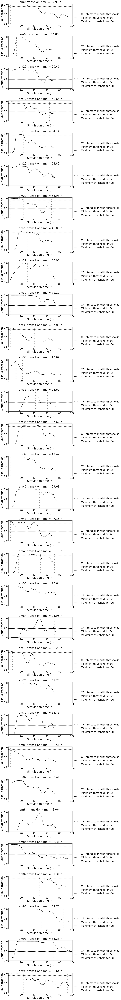

In [9]:
ppe_set = ppe.member_sct_keys
no_of_members = len(ppe_set)
fig, ax = plt.subplots(nrows=no_of_members, figsize=(10,no_of_members*5))
plt.subplots_adjust(hspace = 0.6)
for i, key in enumerate(ppe_set):
    member = vars(ppe)[key]
    title = f"{key} transition time = {member.transition_time:0.2f} h" if member.transition_time is not None else f"{key} did not transition"
    
    plot_individual_cf_timeseries(ax[i], member, title, True)

### Threshold CF calculation plot for paper

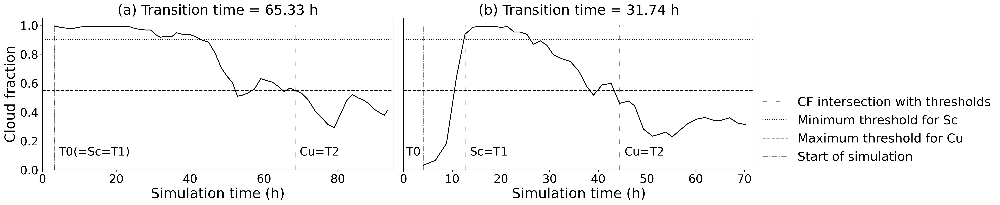

In [8]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(24,5),dpi=300) #,constrained_layout=True)
plt.subplots_adjust(wspace=0.03,left=0.05,right=0.76, bottom=0.15)
for i, (member,letter) in enumerate(zip([ppe.em0, ppe.em8],["a","b"])):
    title = f"({letter}) Transition time = {member.transition_time:.2f} h"
    plot_individual_cf_timeseries(ax[i], member, title, False)

ax[0].plot((ppe.em0.sc_time, ppe.em0.sc_time), (0,1), linestyle="dashdot",c='black',alpha=0.5)
ax[0].text(ppe.em0.sc_time+1,0.1,  'T0', fontsize=SMALL_SIZE)
ax[0].text(ppe.em0.sc_time+5,0.1, '(=Sc=T1)', fontsize=SMALL_SIZE)
ax[0].text(ppe.em0.cu_time+1,0.1,  'Cu=T2', fontsize=SMALL_SIZE)
ax[0].set_xlim((0,95))

ax[1].yaxis.set_visible(False)
ax[1].text(ppe.em8.ds.time_coarse[1]-3.5,0.1, 'T0', fontsize=SMALL_SIZE)
ax[1].text(ppe.em8.sc_time+1,0.1, 'Sc=T1', fontsize=SMALL_SIZE)
ax[1].text(ppe.em8.cu_time+1,0.1, 'Cu=T2', fontsize=SMALL_SIZE)
ax[1].plot((ppe.em8.ds.time_coarse[1], ppe.em8.ds.time_coarse[1]), (0,1), c='black',linestyle="dashdot",alpha=0.5, label="Start of simulation")
ax[1].set_xlim((0,72))

ax[1].legend(loc=(1.01, 0.01), frameon=False)

fig.savefig("figures/transition_calc.png",facecolor='white',dpi=300)
fig.savefig("figures/transition_calc.pdf",facecolor='white',dpi=300)

## Whole PPE cloud fraction timeseries analysis

In [9]:
c1 = '#218380'
c2 = '#FBB13C'

def plot_ensemble_timeseries(ax, ppe_set, start_together=True, include_pre_sc=True, plot3=False, epoch_aligned=False, add_mean=True, add_new_mean=False):
    no_of_members = len(ppe_set)
    times = np.ones((no_of_members, 65))*(-1)
    cf_timeseries = np.ones((no_of_members, 65))*(-1)

    high_ssts = []
    low_sst_vals = []
    high_sst_vals = []
    for i, key in enumerate(ppe_set):
        member = vars(ppe)[key]
        c = 'black'
        lw = 1
        alpha = 0.2

        if include_pre_sc:
            cloud_fraction = member.cloud_fraction
        else:
            cloud_fraction = member.cloud_fraction[member.sc_ind:]
            sst_c = c1 if member.initial_sst<296 else c2
            
            if member.initial_sst>296:
                high_ssts.append(i)

        if start_together:
            start = 0
            end = len(cloud_fraction)
        else:
            start = member.sc_ind
            end = member.sc_ind + len(cloud_fraction)

        if plot3:
            ax.plot([member.sc_time,member.sc_time], [-0.1,1.1],c=sst_c,alpha=0.6)
            
        if epoch_aligned:
            cloud_fraction['time_coarse'] = cloud_fraction.time_coarse - member.sc_time
            c = sst_c
            lw = 1 if member.initial_sst<296 else 2
            alpha = 0.3 if member.initial_sst<296 else 1
                        
            if member.initial_sst>296:
                high_sst_vals.append(member.initial_sst)
            else:
                low_sst_vals.append(member.initial_sst)
        
        cloud_fraction.plot(ax=ax, c=c, alpha=alpha, lw=lw)
        times[i,start:end] = cloud_fraction.time_coarse
        cf_timeseries[i,start:end] = cloud_fraction
    
    cf_timeseries_nan_mask = np.where(cf_timeseries>=0, cf_timeseries, np.nan)
    times_nan_mask = np.where(times>=0, times, np.nan)
    if add_mean:
        cf_mean = np.nanmean(cf_timeseries_nan_mask, axis=0)
        times_mean = np.nanmean(times_nan_mask, axis=0)
        ax.plot(times_mean, cf_mean, c='black', lw=2, label="Mean")
    if add_new_mean:
        new_cf_mean = np.nanmean(np.delete(cf_timeseries_nan_mask, high_ssts, axis=0), axis=0)
        new_times_mean = np.nanmean(np.delete(times_nan_mask, high_ssts, axis=0), axis=0)
        ax.plot(new_times_mean, new_cf_mean, c=c1, lw=2, label="Mean")

    ax.text(0.995, 0, f'{len(ppe_set)} simulations',transform=ax.transAxes, fontsize=SMALL_SIZE-5, va='bottom', ha="right")
    ax.set_xlabel("")
    ax.set_ylabel("")

    return low_sst_vals,high_sst_vals

In [10]:
from matplotlib.legend_handler import HandlerBase

class AnyObjectHandler(HandlerBase):
    def create_artists(self, legend, orig_handle,
                       x0, y0, width, height, fontsize, trans):
        l1 = plt.Line2D([x0,y0+width], [0.7*height,0.7*height], color="black", lw=2)
        l2 = plt.Line2D([x0,y0+width], [0.3*height,0.3*height], color=c1, lw=2)
        return [l1, l2]

/tmp/ipykernel_5359/1490668563.py:55: RuntimeWarning: Mean of empty slice
  cf_mean = np.nanmean(cf_timeseries_nan_mask, axis=0)
/tmp/ipykernel_5359/1490668563.py:56: RuntimeWarning: Mean of empty slice
  times_mean = np.nanmean(times_nan_mask, axis=0)
/tmp/ipykernel_5359/1490668563.py:59: RuntimeWarning: Mean of empty slice
  new_cf_mean = np.nanmean(np.delete(cf_timeseries_nan_mask, high_ssts, axis=0), axis=0)
/tmp/ipykernel_5359/1490668563.py:60: RuntimeWarning: Mean of empty slice
  new_times_mean = np.nanmean(np.delete(times_nan_mask, high_ssts, axis=0), axis=0)


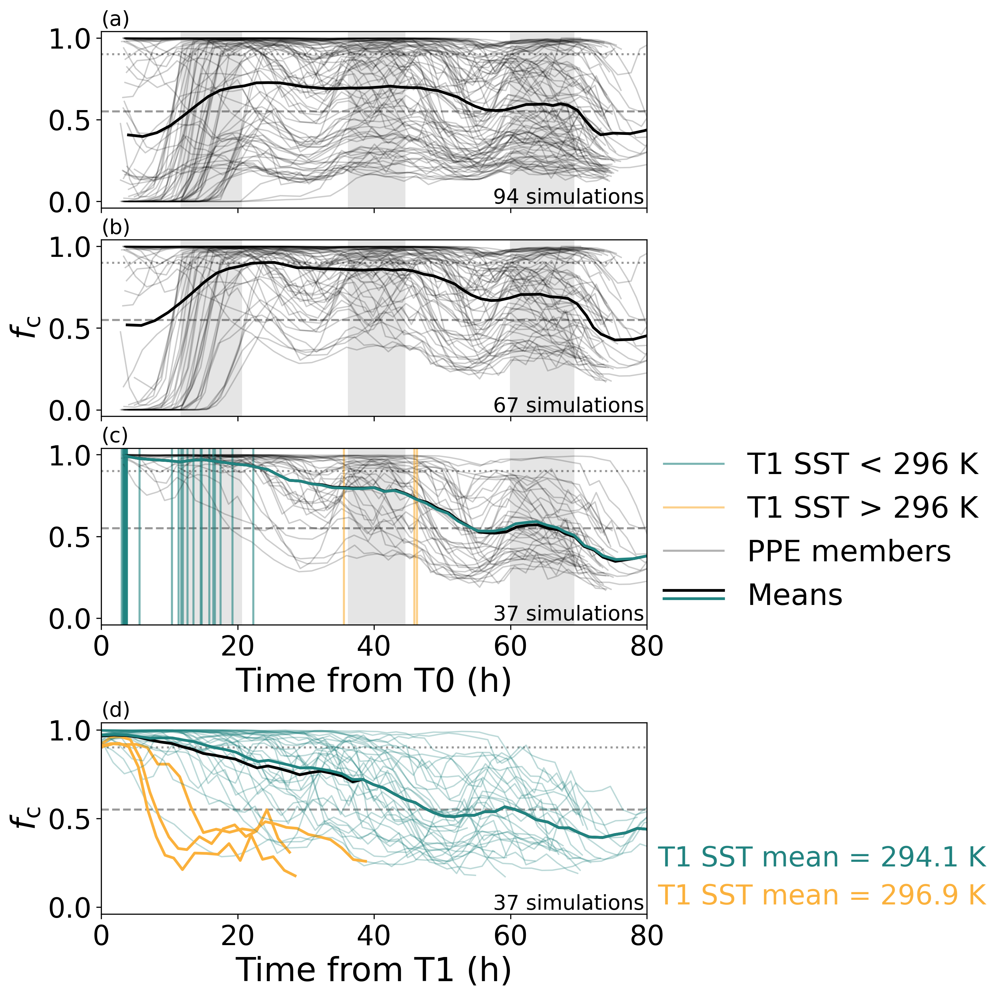

In [11]:
fig = plt.figure(figsize=(10,10),dpi=300)
plt.subplots_adjust(left=0.1,right=0.65, top=0.97)
gs0 = gridspec.GridSpec(2, 1, figure=fig, height_ratios=(3.1,1),hspace=0.25, top=0.97, bottom=0.08,right=0.65)
gs1 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs0[0],hspace=0.18)
ax2 = fig.add_subplot(gs1[2])
ax0 = fig.add_subplot(gs1[0], sharex=ax2, sharey=ax2)
ax1 = fig.add_subplot(gs1[1], sharex=ax2, sharey=ax2)

axes1 = [ax0, ax1, ax2]

plt.setp(ax0.get_xticklabels(), visible=False)
plt.setp(ax1.get_xticklabels(), visible=False)

gs2 = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs0[1])
ax3 = fig.add_subplot(gs2[0], sharey=ax2)
axes = [ax0, ax1, ax2, ax3]

xlim = (0,80)
ylim = (-0.04,1.04)
for i, (ax, letter) in enumerate(zip(axes, ['a','b','c','d'])):
    if i!=3:
        cl.add_diurnal(ppe.em0.ds, ax, ylim)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    
    ax.plot(xlim, (cu_thresh, cu_thresh), linestyle='--', c='black', alpha=0.4)
    ax.plot(xlim, (sc_thresh, sc_thresh), linestyle=':', c='black', alpha=0.4)
   # trans = transforms.ScaledTranslation(-50/72, -17/72, fig.dpi_scale_trans)
    ax.text(0.0, 1.01, f'({letter})',transform=ax.transAxes, fontsize=SMALL_SIZE-5, va='bottom')

plot_ensemble_timeseries(ax0, ppe.member_keys, start_together=True, include_pre_sc=True, add_mean=True)
plot_ensemble_timeseries(ax1, ppe.member_sc_keys, start_together=True, include_pre_sc=True, add_mean=True)
plot_ensemble_timeseries(ax2, ppe.member_sct_keys, start_together=False, include_pre_sc=False, plot3=True, add_mean=True, add_new_mean=True)
high_sst, low_sst = plot_ensemble_timeseries(ax3, ppe.member_sct_keys, start_together=True, include_pre_sc=False, epoch_aligned=True, add_mean=True, add_new_mean=True)

blues = lines.Line2D([], [], c=c1, alpha=0.6)
yellows = lines.Line2D([], [], c=c2, alpha=0.6)
ppe_mems = lines.Line2D([], [], c='black', alpha=0.3)

ax2.legend(handler_map={object: AnyObjectHandler()}, handles=[blues, yellows, ppe_mems, object], 
             labels=["T1 SST < 296 K", "T1 SST > 296 K", "PPE members", "Means"], 
             loc=(1.01,0.01), frameon=False)

ax3.text(1.02, 0.25, f'T1 SST mean = {np.mean(high_sst):0.1f} K',transform=ax.transAxes, fontsize=SMALL_SIZE, c=c1)
ax3.text(1.02, 0.05, f'T1 SST mean = {np.mean(low_sst):0.1f} K',transform=ax.transAxes, fontsize=SMALL_SIZE, c=c2)

ax1.set_ylabel(r"$\mathit{f}_\mathrm{c}$")
ax2.set_xlabel("Time from T0 (h)")
ax3.set_xlabel("Time from T1 (h)")
ax3.set_ylabel(r"$\mathit{f}_\mathrm{c}$")

fig.savefig("figures/whole_ppe_cf_timeseries.png",facecolor='white',dpi=300)
fig.savefig("figures/whole_ppe_cf_timeseries.pdf",facecolor='white',dpi=300)

### Save good ensemble members to csv for emulating

In [ ]:
ppe_sct_length = len(ppe.member_sct_keys)-3
transition_time = np.zeros(ppe_sct_length)
t_begin = np.zeros(ppe_sct_length)
rwp_mean = np.zeros(ppe_sct_length)
parameter_inputs = np.zeros((ppe_sct_length, 6))

i = 0
for key in ppe.member_sct_keys:
    member = vars(ppe)[key]
    if member.initial_sst < 296:
        transition_time[i] = member.transition_time
        t_begin[i] = member.t_begin_time_sc
        parameter_inputs[i] = member.inputs
        rwp_mean[i] = member.rwp_mean
        i += 1

np.savetxt("data/output_data/transition_time_output.csv", transition_time, delimiter=',', header="transition_time", comments='')
np.savetxt("data/output_data/rwp_mean_output.csv", rwp_mean, delimiter=',', header="rwp_mean", comments='')
#np.savetxt("data/input_data/post_spinup_inputs.csv", parameter_inputs, delimiter=',', header="qv_bl,inv,delt,delq,na,baut", comments='')
np.savetxt("data/input_data/sc_beginning_inputs.csv", parameter_inputs, delimiter=',', header="qv_bl,inv,delt,delq,na,baut", comments='')

In [ ]:
for key in ppe.member_sct_keys:
    member = vars(ppe)[key]
    if member.initial_sst > 296:
        print(member.initial_sst)

## Rain water path timeseries analysis

In [12]:
blue_colour = "#2d93adff"
red_colour = "#c83737ff"

def plot_ensemble_timeseries(ax, ppe_set, output_type, threshold, start_together=True, include_pre_sc=True, epoch_aligned=False, add_means=True):
    no_of_members = len(ppe_set)
    high_times = np.ones((no_of_members, 180))*(-1)
    low_times = np.ones((no_of_members, 180))*(-1)
    high_timeseries = np.ones((no_of_members, 180))*(-1)
    low_timeseries = np.ones((no_of_members, 180))*(-1)

    i = 0
    j = 0
    for key in ppe_set:
        member = vars(ppe)[key]

        if member.initial_sst < 296:
            sc_index = member.sc_ind
            rwp = member.rwp*1e3            
            smoother=5
            rwp_rolling = rwp.rolling(time_fine=smoother, center=True).mean()

            rwp_c = blue_colour if member.rwp_mean > threshold else red_colour

            if output_type=="rwp":
                output = rwp_rolling
                time_key = "time_fine"
            elif output_type=="cloud_frac":
                output = member.cloud_fraction
                time_key = "time_coarse"
            elif output_type=="aerosol":
                output = member.ds.accumulation_number_bl*1e-6
                time_key = "time_coarse"
    
            if include_pre_sc:
                output = output
            else:
                output = output[sc_index:]
    
            if start_together:
                start = 0
                end = len(output)
            else:
                start = sc_index
                end = sc_index + len(output)
    
            if epoch_aligned:
                output[time_key] = output[time_key] - member.sc_time

            output.plot(ax=ax, c=rwp_c, alpha=0.3)

            if member.rwp_mean > threshold:
                high_times[i,start:end] = output[time_key]
                high_timeseries[i,start:end] = output
                i+=1
            else:
                low_times[j,start:end] = output[time_key]
                low_timeseries[j,start:end] = output
                j+=1
    
    high_timeseries_nan_mask = np.where(high_timeseries>=0, high_timeseries, np.nan)
    high_times_nan_mask = np.where(high_times>=0, high_times, np.nan)
    low_timeseries_nan_mask = np.where(low_timeseries>=0, low_timeseries, np.nan)
    low_times_nan_mask = np.where(low_times>=0, low_times, np.nan)

    high_valid, = np.where(np.count_nonzero(~np.isnan(high_timeseries_nan_mask),axis=0)>=6)
    low_valid, = np.where(np.count_nonzero(~np.isnan(low_timeseries_nan_mask),axis=0)>=6)
    
    if add_means:
        high_mean = np.nanmedian(high_timeseries_nan_mask, axis=0)
        high_times_mean = np.nanmean(high_times_nan_mask, axis=0)
        ax.plot(high_times_mean[high_valid[0]:high_valid[-1]], high_mean[high_valid[0]:high_valid[-1]], c=blue_colour, lw=3, label="Mean")
        low_mean = np.nanmedian(low_timeseries_nan_mask, axis=0)
        low_times_mean = np.nanmean(low_times_nan_mask, axis=0)
        ax.plot(low_times_mean[low_valid[0]:low_valid[-1]], low_mean[low_valid[0]:low_valid[-1]], c=red_colour, lw=3, label="Mean")
    else:
        high_mean = None
        high_times_mean = None
        low_mean = None
        low_times_mean = None

    return high_timeseries_nan_mask, high_times_mean, low_timeseries_nan_mask, low_times_mean, high_mean, low_mean

In [13]:
blue_colour = "#2d93adff"
red_colour = "#c83737ff"

from matplotlib.legend_handler import HandlerBase

class AnyObjectHandler(HandlerBase):
    def create_artists(self, legend, orig_handle,
                       x0, y0, width, height, fontsize, trans):
        l1 = plt.Line2D([x0,y0+width], [0.7*height,0.7*height], color=blue_colour, lw=3)
        l2 = plt.Line2D([x0,y0+width], [0.3*height,0.3*height], color=red_colour, lw=3)
        return [l1, l2]

/tmp/ipykernel_580/1396947918.py:75: RuntimeWarning: All-NaN slice encountered
  high_mean = np.nanmedian(high_timeseries_nan_mask, axis=0)
/tmp/ipykernel_580/1396947918.py:76: RuntimeWarning: Mean of empty slice
  high_times_mean = np.nanmean(high_times_nan_mask, axis=0)
/tmp/ipykernel_580/1396947918.py:78: RuntimeWarning: All-NaN slice encountered
  low_mean = np.nanmedian(low_timeseries_nan_mask, axis=0)
/tmp/ipykernel_580/1396947918.py:79: RuntimeWarning: Mean of empty slice
  low_times_mean = np.nanmean(low_times_nan_mask, axis=0)
/tmp/ipykernel_580/1396947918.py:75: RuntimeWarning: All-NaN slice encountered
  high_mean = np.nanmedian(high_timeseries_nan_mask, axis=0)
/tmp/ipykernel_580/1396947918.py:76: RuntimeWarning: Mean of empty slice
  high_times_mean = np.nanmean(high_times_nan_mask, axis=0)
/tmp/ipykernel_580/1396947918.py:78: RuntimeWarning: All-NaN slice encountered
  low_mean = np.nanmedian(low_timeseries_nan_mask, axis=0)
/tmp/ipykernel_580/1396947918.py:79: RuntimeWar

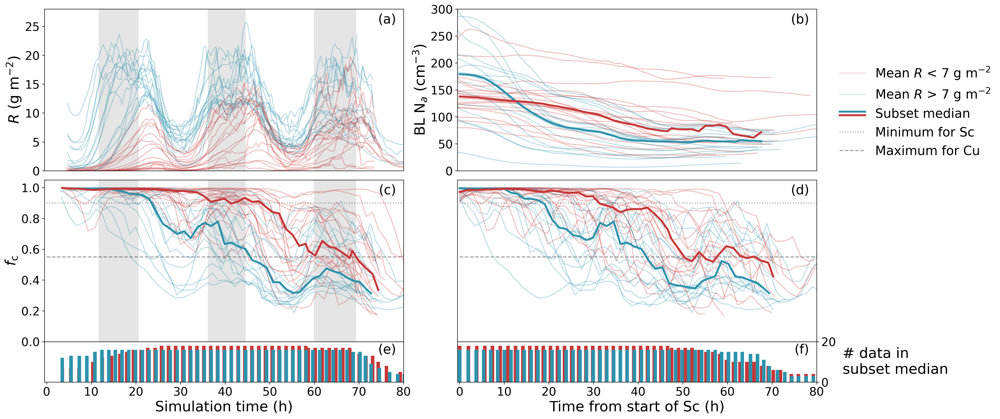

In [11]:
SMALL_SIZE = 18
LARGE_SIZE = 22
MEDIUM_SIZE = 20

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=LARGE_SIZE)    # fontsize of the axes title
plt.rc('axes', labelsize=LARGE_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE-0.5)    # legend fontsize
plt.rc('figure', titlesize=LARGE_SIZE)  # fontsize of the figure title

### Plotting cloud fraction split by rain threshold
fig = plt.figure(figsize=(22,9.5),dpi=300)
gs0 = gridspec.GridSpec(2, 2, figure=fig, hspace=0.05, wspace=0.15, height_ratios=(0.8, 1),left=0.05,top=0.95,right=0.8)

ax0 = fig.add_subplot(gs0[0,0])
ax0.xaxis.set_visible(False)

ax1 = fig.add_subplot(gs0[0,1])
ax1.xaxis.set_visible(False)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1,0], height_ratios=(0.8,0.2), hspace=0)
ax2 = fig.add_subplot(gs1[0])
ax2.xaxis.set_visible(False)
ax25 = fig.add_subplot(gs1[1])
ax25.yaxis.set_visible(False)

gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1,1], height_ratios=(0.8,0.2), hspace=0)
ax3 = fig.add_subplot(gs2[0])
ax3.xaxis.set_visible(False)
ax3.yaxis.set_visible(False)
ax35 = fig.add_subplot(gs2[1])

for a, letter, ylim in zip([ax0, ax1, ax2, ax25, ax3, ax35], ['(a)','(b)','(c)','(e)','(d)','(f)'], [(0,28), (0, 300), (0, 1.05), (0,20), (0, 1.05), (0,20)]):
    a.set_xlim((-0.5, 80))
    a.set_ylim(ylim)
    
    if a in [ax0, ax2]:
        cl.add_diurnal(ppe.em0.ds, a, ylim)
    if a in [ax2, ax3]:
        a.plot(xlim, (cu_thresh, cu_thresh), linestyle='--', c='black', alpha=0.4)
        a.plot(xlim, (sc_thresh, sc_thresh), linestyle=':', c='black', alpha=0.4)

    trans = transforms.ScaledTranslation(-50/72, -17/72, fig.dpi_scale_trans)
    a.text(1.07, 0.98, f'{letter}',transform=a.transAxes + trans, fontsize=MEDIUM_SIZE, ha='right')

rain_thresh = 7
plot_ensemble_timeseries(ax0, ppe.member_sct_keys, "rwp", rain_thresh, start_together=False, include_pre_sc=True, epoch_aligned=False, add_means=False)
ax1_high_mask, ax1_high_times, ax1_low_mask, ax1_low_times, high_mean, low_mean= plot_ensemble_timeseries(ax1, ppe.member_sct_keys, "aerosol", rain_thresh, start_together=True, include_pre_sc=False, epoch_aligned=True, add_means=True)
ax2_high_mask, ax2_high_times, ax2_low_mask, ax2_low_times, high_mean, low_mean= plot_ensemble_timeseries(ax2, ppe.member_sct_keys, "cloud_frac", rain_thresh, start_together=False, include_pre_sc=False, epoch_aligned=False, add_means=True)
ax3_high_mask, ax3_high_times, ax3_low_mask, ax3_low_times, high_mean, low_mean = plot_ensemble_timeseries(ax3, ppe.member_sct_keys, "cloud_frac", rain_thresh, start_together=True, include_pre_sc=False, epoch_aligned=True, add_means=True)

ax25.bar(ax2_low_times, np.count_nonzero(~np.isnan(ax2_low_mask),axis=0), color=red_colour, align='center')
ax25.bar(ax2_high_times, np.count_nonzero(~np.isnan(ax2_high_mask),axis=0), color=blue_colour, align='center')
ax35.bar(ax3_low_times, np.count_nonzero(~np.isnan(ax3_low_mask),axis=0), color=red_colour, align='center')
ax35.bar(ax3_high_times, np.count_nonzero(~np.isnan(ax3_high_mask),axis=0), color=blue_colour, align='center')

ax25.set_xlabel("Simulation time (h)")
ax35.set_xlabel("Time from start of Sc (h)")
ax0.set_ylabel(r"$\mathit{R}$ (g m$^{-2}$)")
ax1.set_ylabel(r"BL N$_a$ (cm$^{-3}$)")
ax2.set_ylabel(r"$\mathit{f}_\mathrm{c}$")

ax35.yaxis.tick_right()
ax35.yaxis.set_label_position("right")
ax35_ylabel = "# data in \nsubset median"
ax35.set_ylabel(ax35_ylabel, rotation="horizontal", labelpad=10, ha='left', va='center')

blue_line = lines.Line2D([], [], c=blue_colour, alpha=0.3, lw=1)
orange_line = lines.Line2D([], [], c=red_colour, alpha=0.3, lw=1)
dotted_line = lines.Line2D([], [], c='black', alpha=0.4, linestyle=':')
dashed_line = lines.Line2D([], [], c='black', alpha=0.4, linestyle='--')
ax1.legend(handler_map={object: AnyObjectHandler()}, handles=[orange_line, blue_line, object, dotted_line, dashed_line], 
             labels=[r"Mean $\mathit{R}$ < "+ str(rain_thresh) + r" g m$^{-2}$", r"Mean $\mathit{R}$ > "+ str(rain_thresh) + r" g m$^{-2}$", "Subset median", "Minimum for Sc", "Maximum for Cu"], 
             loc=(1.05,0.05), frameon=False)

fig.savefig("figures/rwp_cf_timeseries.png",facecolor='white',dpi=300)
fig.savefig("figures/rwp_cf_timeseries.pdf",facecolor='white',dpi=300)